In [1]:
# reload modules if needed
%load_ext autoreload
%autoreload 2

In [2]:
import json
import os
import numpy as np

import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import seaborn as sns

from scipy.stats import pearsonr, spearmanr
from notebook_utils import get_distribution_over_vocabulary, get_mlm_results, get_downstream_results
from scipy.spatial.distance import jensenshannon

import itertools


In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
FIGURE_DIR = "/home/limisiewicz/my-luster/entangled-in-scripts/output/figures"
TABLE_DIR =  "/home/limisiewicz/my-luster/entangled-in-scripts/output/tables"

In [5]:
plt.rcParams['font.family'] = 'serif'
plt.rcParams['text.usetex'] = True
#plt.rcParams['text.usetex'] = False
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 32
plt.rcParams['axes.labelsize'] = 26
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams['axes.titlesize'] = 26
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 26
plt.rcParams['ytick.labelsize'] = 26
plt.rcParams['legend.fontsize'] = 18

## Parameters

In [6]:
name_map = {
    '20l-multilingual': 'Unigram',
    '20l-bpe': 'BPE',
    '20l-merged': 'TokMix'
}

In [7]:
languages = ("ar", "tr", "zh", "el", "es", "en", "sw", "hi", "mr", "ur", "ta", "te", "th", "ru", "bg", "he", "ka", "vi", "fr", "de")
languages_by_script = ("zh", "he", "ka", "ar", "ur", "hi", "mr", "ta", "te", "th", "el","ru", "bg", "sw", "vi","tr", "fr", "de", "es", "en")
languages_pos = ("zh", "he", "ar", "ur", "hi", "mr", "ta", "te", "el","ru", "bg", "vi","tr", "fr", "de", "es", "en")
languages_xnli = ("zh", "ar", "ur", "hi", "th", "el","ru", "bg", "sw", "vi","tr", "fr", "de", "es", "en")


same_script = list(itertools.permutations(("ar", "ur"),2)) + \
              list(itertools.permutations(("ur", "mr"),2)) + \
              list(itertools.permutations(("ru", "bg"),2)) + \
              list(itertools.permutations(("sw", "vi","tr", "fr", "de", "es", "en"),2))

n_lang_pairs = len(languages) * (len(languages) - 1)
n_lang_pairs_ss = len(same_script)

alpha = 0.25
tokenization_types = ('20l-multilingual', '20l-merged', '20l-bpe')
N_vocab = 120000

ft_type = 'PROBE'

In [8]:
X_lang_results = pd.DataFrame(columns=['task', 'metric', 'tokenizer','diff-script', 'same-script','all'])
X_lang_stds = pd.DataFrame(columns=['task', 'metric', 'tokenizer','diff-script', 'same-script','all'])

In [9]:
X_trans_results = pd.DataFrame(columns=['task', 'metric', 'tokenizer','src', 'tgt','value'])
X_trans_stds = pd.DataFrame(columns=['task', 'metric', 'tokenizer','src', 'tgt','vlue'])

# Tokenizers and Overlap Usage

In [10]:
vocab_distributions = dict()
vocab_dist_arrays = dict()
vocab_frequencies = dict()

for tok_type in tokenization_types:
    vocab_distributions[tok_type], vocab_frequencies[tok_type] \
        = get_distribution_over_vocabulary(tok_type, alpha, N_vocab, languages)
    vocab_dist_arrays[tok_type] = {lang: np.array(list(vocab_distributions[tok_type][lang].values()))
                                   for lang in languages + ('All',)}

## JSD across tokenizers

Jeensehn Shannon Divergence

In [11]:
jsd = {}

for t_idx, tokenization in enumerate(tokenization_types):
    jsd[tokenization] = {}
    for lang1, lang2 in itertools.product(languages, languages):
        jsd[tokenization][(lang1, lang2)] = jensenshannon(vocab_dist_arrays[tokenization][lang1],
                                                          vocab_dist_arrays[tokenization][lang2], base=2.) ** 2
    

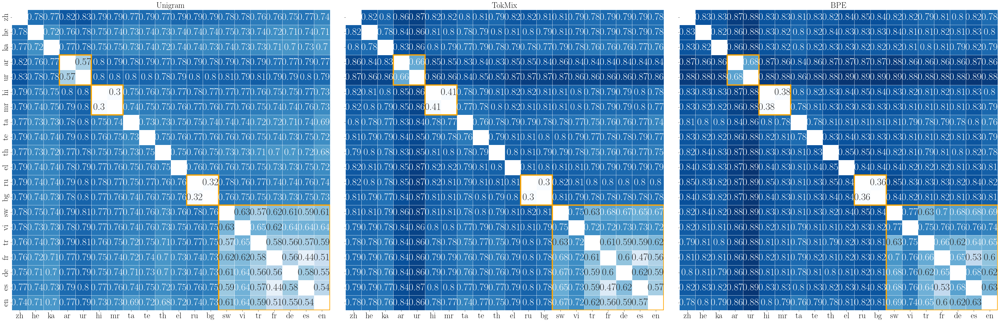

In [12]:
fig, axes = plt.subplots(1, 3,figsize=(45, 15),sharex=True,sharey=True)
axes = axes.ravel()

for t_idx, tokenization in enumerate(tokenization_types):
    ax = axes[t_idx]
    
    divergences = np.array([[jsd[tokenization][(lang1, lang2)] for lang1 in languages_by_script]
                            for lang2 in languages_by_script])
    mask = np.eye(divergences.shape[0], dtype='bool')
    
    sns.heatmap(divergences, mask=mask, annot=True, linewidths=.5, ax=axes[t_idx], cmap="Blues",
               vmin=0.4, vmax=.9, cbar=False)
    
    axes[t_idx].add_patch(patches.Rectangle(
         (3, 3), 2.0, 2.0,
         edgecolor='orange',fill=False, lw=4
     ) )
    axes[t_idx].add_patch(patches.Rectangle(
         (5, 5), 2.0, 2.0,
         edgecolor='orange',fill=False, lw=4
     ) )
    axes[t_idx].add_patch(patches.Rectangle(
         (11, 11), 2.0, 2.0,
         edgecolor='orange',fill=False, lw=4
     ) )
    axes[t_idx].add_patch(patches.Rectangle(
         (13, 13), 7.0, 7.0,
         edgecolor='orange',fill=False, lw=4
     ) )
    
    axes[t_idx].set_xticks(np.arange(len(languages)) + 0.5, labels=languages_by_script)
    axes[t_idx].set_yticks(np.arange(len(languages)) + 0.5, labels=languages_by_script)
    axes[t_idx].set_title(f"{name_map[tokenization]}")

    
plt.tight_layout()
plt.savefig(os.path.join(FIGURE_DIR, "jensehnshannon_d_20L.pdf"), dpi=300)
plt.show()

Average allocation

In [13]:
for tokenization in tokenization_types:
    jsd_est = {'task': 'overlap', 'metric': 'JSD', 'diff-script': 0., 'same-script': 0., 'all': 0.,
                'tokenizer': tokenization} 
    jsd_std = {'task': 'overlap', 'metric': 'JSD', 'diff-script': 0., 'same-script': 0., 'all': 0.,
                'tokenizer': tokenization} 

    for lang1, lang2 in itertools.product(languages, languages):
        if lang1 != lang2:
            jsd_est['all'] += jsd[tokenization][(lang1, lang2)] / n_lang_pairs
            if (lang1, lang2) in same_script:
                jsd_est['same-script'] += jsd[tokenization][(lang1, lang2)]/ n_lang_pairs_ss
            else:
                jsd_est['diff-script'] += jsd[tokenization][(lang1, lang2)] / (n_lang_pairs - n_lang_pairs_ss)
    
            
            X_trans_results = X_trans_results.append({'task': 'overlap', 'metric': 'JSD', 'tokenizer': tokenization, 
                                                      'src': lang1, 'tgt': lang2,
                                                      'value': jsd[tokenization][(lang1, lang2)]}, ignore_index=True)
            X_trans_stds = X_trans_stds.append({'task': 'overlap', 'metric': 'JSD', 'tokenizer': tokenization,
                                                'src': lang1, 'tgt': lang2,
                                                'value': 0.},ignore_index=True)

            

    X_lang_results = X_lang_results.append(jsd_est, ignore_index=True)
    X_lang_stds = X_lang_stds.append(jsd_std, ignore_index=True)

# Results for LMs

## Down-stream cross-lingual transfer (Heatmaps)


POS

In [14]:
pos_results = dict()
pos_stds = dict()

metrics = ('accuracy','f1-macro')
for tok_type in tokenization_types:
    pos_results[tok_type], pos_stds[tok_type] =  get_downstream_results(tok_type, alpha, N_vocab, languages_pos,
                                                                        'POS',ft_type=ft_type, metrics=metrics,
                                                                        seeds=(1230,1231, 1232))


/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/de/accuracy_evaluation/zh/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/de/accuracy_evaluation/he/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/de/accuracy_evaluation/ar/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/de/accuracy_evaluation/ur/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/de/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in

/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/zh/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/he/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/ar/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/ur/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-

/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/zh/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/he/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/ar/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/ur/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/hi/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-

/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/zh/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/he/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/ar/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/ur/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenizatio

/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/zh/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/he/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/ar/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/ur/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1231/fr/f1-macro_evaluation/hi/f1-macro_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/POS_PROBE/20l-bpe-tokenizatio

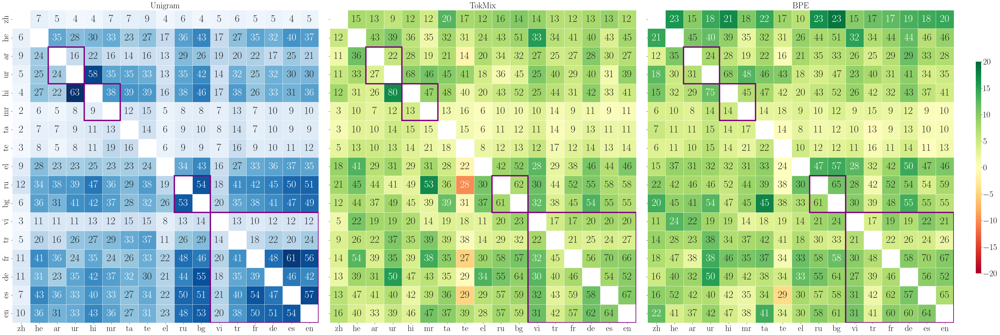

In [16]:
metric = 'f1-macro'
fig, axes = plt.subplots(1, 3,figsize=(45, 15),sharex=True,sharey=True)
cbar_ax = fig.add_axes([0.93, .2, .005, .6])
axes = axes.ravel()
for t_id, tokenization in enumerate(tokenization_types):
    mask = np.eye(len(languages_pos), dtype='bool')
    res = np.zeros_like(mask, dtype=np.float)
    for idx, lang1 in enumerate(languages_pos):
        for jdx, lang2 in enumerate(languages_pos):
            res[idx, jdx] = pos_results[tokenization][metric][lang1][lang2] * 100

    if t_id== 0:
        res_base = res
        sns.heatmap(res, mask=mask,fmt='.0f', annot=True, linewidths=.5, ax=axes[t_id],
                    cmap="Blues", cbar=False)
    else:
        sns.heatmap(res - res_base,fmt='.0f', mask=mask, annot=res, linewidths=.5,
                    ax=axes[t_id], cmap='RdYlGn', vmin=-20, vmax=20,
                    cbar= t_id == 1,
                    cbar_ax = None if (t_id!=1) else cbar_ax)
        

    axes[t_id].add_patch(patches.Rectangle(
         (2, 2), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (4, 4), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (9, 9), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (11, 11), 6.0, 6.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    
    axes[t_id].set_xticks(np.arange(len(languages_pos)) + 0.5, labels=languages_pos)
    axes[t_id].set_yticks(np.arange(len(languages_pos)) + 0.5, labels=languages_pos)
    axes[t_id].set_title(f"{name_map[tokenization]}")

#fig.suptitle("POS F1")
fig.tight_layout(rect=[0, 0,0.92, 1])
fig.savefig(os.path.join(FIGURE_DIR, "POS_F1_transfer_20l.pdf"), dpi=300)
fig.show()

NER

In [17]:
ner_results = dict()
ner_stds = dict()

metrics = ('f1-seqeval','f1-macro')
for tok_type in tokenization_types:
    ner_results[tok_type], ner_stds[tok_type] =  get_downstream_results(tok_type, alpha, N_vocab, languages,
                                                                        'NER',ft_type=ft_type, metrics=metrics,
                                                                        seeds=(1230,1231, 1232))


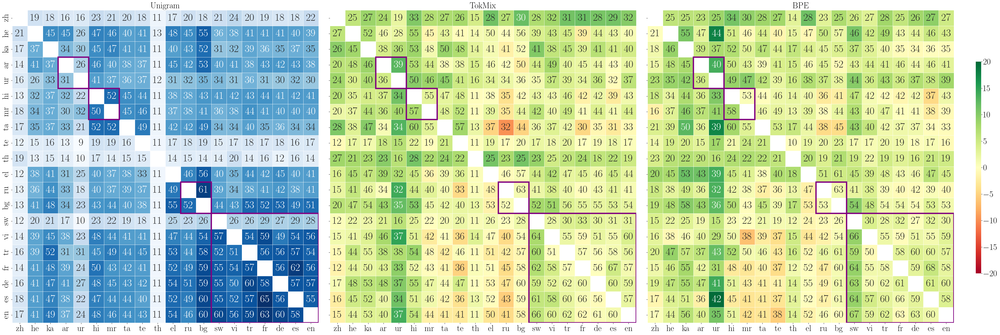

In [18]:
metric = 'f1-macro'
fig, axes = plt.subplots(1, 3,figsize=(45, 15),sharex=True,sharey=True)
cbar_ax = fig.add_axes([0.93, .2, .005, .6])
axes = axes.ravel()
for t_id, tokenization in enumerate(tokenization_types):
    mask = np.eye(len(languages), dtype='bool')
    res = np.zeros_like(mask, dtype=np.float)
    for idx, lang1 in enumerate(languages_by_script):
        for jdx, lang2 in enumerate(languages_by_script):
            res[idx, jdx] = ner_results[tokenization][metric][lang1][lang2] * 100

    if t_id== 0:
        res_base = res
        sns.heatmap(res, mask=mask,fmt='.0f', annot=True, linewidths=.5, ax=axes[t_id],
                    cmap="Blues", cbar=False)
    else:
        sns.heatmap(res - res_base,fmt='.0f', mask=mask, annot=res, linewidths=.5,
                    ax=axes[t_id], cmap='RdYlGn', vmin=-20, vmax=20,
                    cbar= t_id == 1,
                    cbar_ax = None if (t_id!=1) else cbar_ax)
        
    axes[t_id].add_patch(patches.Rectangle(
         (3, 3), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (5, 5), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (11, 11), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (13, 13), 7.0, 7.0,
         edgecolor='purple',fill=False, lw=4
     ) )

    axes[t_id].set_xticks(np.arange(len(languages_by_script)) + 0.5, labels=languages_by_script)
    axes[t_id].set_yticks(np.arange(len(languages_by_script)) + 0.5, labels=languages_by_script)
    axes[t_id].set_title(f"{name_map[tokenization]}")

#fig.suptitle("NER F1")

fig.tight_layout(rect=[0, 0,0.92, 1])
fig.savefig(os.path.join(FIGURE_DIR, "NER_F1_transfer_20L.pdf"), dpi=300)
fig.show()

UD

In [19]:
ud_results = dict()
ud_stds = dict()

metrics = ('f1','accuracy')
for tok_type in tokenization_types:
    ud_results[tok_type], ud_stds[tok_type] =  get_downstream_results(tok_type, alpha, N_vocab, languages_pos,
                                                                        'UD',ft_type=ft_type, metrics=metrics,
                                                                        seeds=(2000,2001, 2002))

/home/limisiewicz/my-luster/entangled-in-scripts/models/UD_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_2001/ur/f1_evaluation/zh/f1_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/UD_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_2001/ur/f1_evaluation/he/f1_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/UD_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_2001/ur/f1_evaluation/ar/f1_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/UD_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_2001/ur/f1_evaluation/ur/f1_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/UD_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_2001/ur/f1_evaluation/hi/f1_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/UD_PROBE/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_2001/ur/f

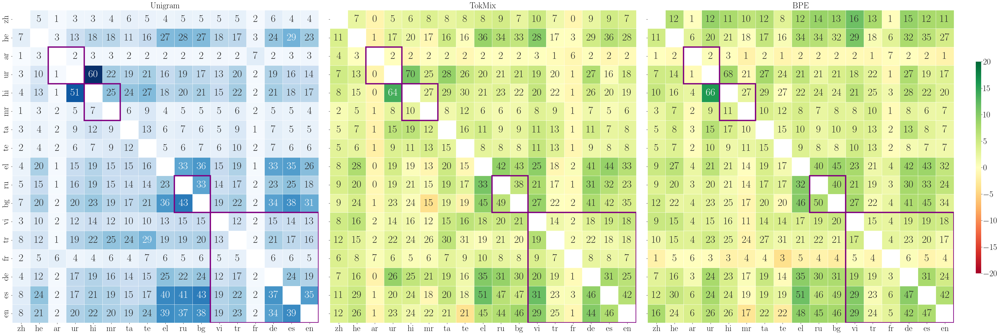

In [20]:
metric = 'f1'
fig, axes = plt.subplots(1, 3,figsize=(45, 15),sharex=True,sharey=True)
cbar_ax = fig.add_axes([0.93, .2, .005, .6])
axes = axes.ravel()
for t_id, tokenization in enumerate(tokenization_types):
    mask = np.eye(len(languages_pos), dtype='bool')
    res = np.zeros_like(mask, dtype=np.float)
    for idx, lang1 in enumerate(languages_pos):
        for jdx, lang2 in enumerate(languages_pos):
            res[idx, jdx] = ud_results[tokenization][metric][lang1][lang2] * 100

    if t_id== 0:
        res_base = res
        sns.heatmap(res, mask=mask,fmt='.0f', annot=True, linewidths=.5, ax=axes[t_id],
                    cmap="Blues", cbar=False)
    else:
        sns.heatmap(res - res_base,fmt='.0f', mask=mask, annot=res, linewidths=.5,
                    ax=axes[t_id], cmap='RdYlGn', vmin=-20, vmax=20,
                    cbar= t_id == 1,
                    cbar_ax = None if (t_id!=1) else cbar_ax)
        

    axes[t_id].add_patch(patches.Rectangle(
         (2, 2), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (4, 4), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (9, 9), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (11, 11), 6.0, 6.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    
    axes[t_id].set_xticks(np.arange(len(languages_pos)) + 0.5, labels=languages_pos)
    axes[t_id].set_yticks(np.arange(len(languages_pos)) + 0.5, labels=languages_pos)
    axes[t_id].set_title(f"{name_map[tokenization]}")

#fig.suptitle("POS F1")
fig.tight_layout(rect=[0, 0,0.92, 1])
fig.savefig(os.path.join(FIGURE_DIR, "UD_F1_transfer_20l.pdf"), dpi=300)
fig.show()

XNLI

In [21]:
xnli_results = dict()
xnli_stds = dict()

metrics = ('accuracy',)
for tok_type in tokenization_types:
    xnli_results[tok_type], xnli_stds[tok_type] =  get_downstream_results(tok_type, alpha, N_vocab, languages_xnli,
                                                                        'XNLI', ft_type=ft_type, metrics=metrics,
                                                                        seeds=(2000,2001,2002))

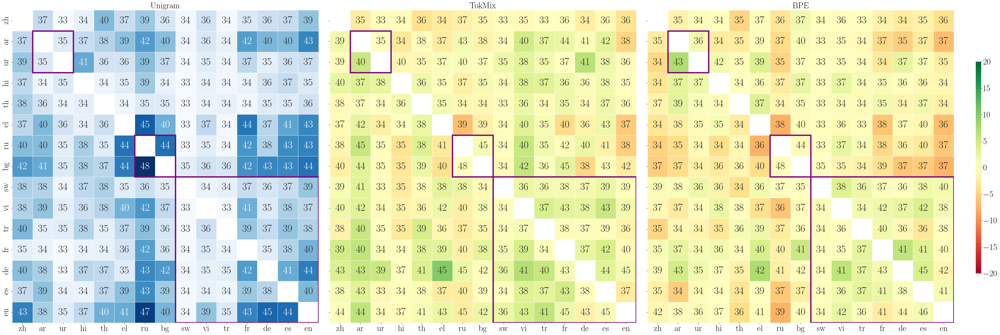

In [22]:
metric = 'accuracy'
fig, axes = plt.subplots(1, 3,figsize=(45, 15),sharex=True,sharey=True)
cbar_ax = fig.add_axes([0.93, .2, .005, .6])
axes = axes.ravel()
for t_id, tokenization in enumerate(tokenization_types):
    mask = np.eye(len(languages_xnli), dtype='bool')
    res = np.zeros_like(mask, dtype=np.float)
    for idx, lang1 in enumerate(languages_xnli):
        for jdx, lang2 in enumerate(languages_xnli):
            res[idx, jdx] = xnli_results[tokenization][metric][lang1][lang2] * 100

    if t_id== 0:
        res_base = res
        sns.heatmap(res, mask=mask,fmt='.0f', annot=True, linewidths=.5, ax=axes[t_id],
                    cmap="Blues", cbar=False)
    else:
        sns.heatmap(res - res_base,fmt='.0f', mask=mask, annot=res, linewidths=.5,
                    ax=axes[t_id], cmap='RdYlGn', vmin=-20, vmax=20,
                    cbar= t_id == 1,
                    cbar_ax = None if (t_id!=1) else cbar_ax)
    axes[t_id].add_patch(patches.Rectangle(
         (1, 1), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) ) 
    axes[t_id].add_patch(patches.Rectangle(
         (6, 6), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (8, 8), 7.0, 7.0,
         edgecolor='purple',fill=False, lw=4
     ) )

    axes[t_id].set_xticks(np.arange(len(languages_xnli)) + 0.5, labels=languages_xnli)
    axes[t_id].set_yticks(np.arange(len(languages_xnli)) + 0.5, labels=languages_xnli)
    axes[t_id].set_title(f"{name_map[tokenization]}")

#fig.suptitle("XNLI Accuracy")

fig.tight_layout(rect=[0, 0,0.92, 1])
fig.savefig(os.path.join(FIGURE_DIR, "XNLI_Acc_transfer_20L.pdf"), dpi=300)
fig.show()

Tatoeba

In [23]:
tatoeba_results = dict()
tatoeba_stds = dict()

metrics = ('accuracy',)
for tok_type in tokenization_types:
    tatoeba_results[tok_type], tatoeba_stds[tok_type] =  get_downstream_results(tok_type, alpha, N_vocab, languages,
                                                                        'ALIGN', ft_type='', metrics=metrics,
                                                                        seeds=(1234,))
    
    for lang1 in languages:
        for lang2 in languages:
            if tatoeba_results[tok_type][metric][lang1][lang2] == 0:
                tatoeba_results[tok_type][metric][lang1][lang2] = np.nan
                tatoeba_stds[tok_type][metric][lang1][lang2] = np.nan

/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/ar/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/sw/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/mr/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/ta/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIG

/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/el/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/sw/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/mr/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/ur/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIG

/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/de/accuracy_evaluation/ta/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/de/accuracy_evaluation/te/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-multilingual-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/de/accuracy_evaluation/de/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/ar/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/sw/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged

/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/sw/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/mr/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/ur/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/ta/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alph

/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-merged-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/de/accuracy_evaluation/de/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/ar/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/sw/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/ar/accuracy_evaluation/mr/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-tr

/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/hi/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/mr/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/ur/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/ta/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/th/accuracy_evaluation/te/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train

/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/de/accuracy_evaluation/te/accuracy_all.txt not found.
/home/limisiewicz/my-luster/entangled-in-scripts/models/ALIGN/20l-bpe-tokenization/alpha-0.25_alpha-train-0.25_N-120000_1234/de/accuracy_evaluation/de/accuracy_all.txt not found.


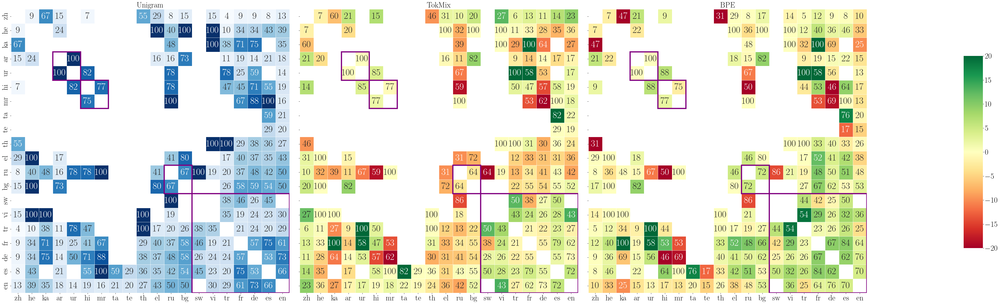

In [24]:
metric = 'accuracy'
fig, axes = plt.subplots(1, 3,figsize=(45, 15),sharex=True,sharey=True)
cbar_ax = fig.add_axes([1.01, .2, .02, .6])
axes = axes.ravel()
for t_id, tokenization in enumerate(tokenization_types):
    mask = np.eye(len(languages), dtype='bool') 
    res = np.zeros_like(mask, dtype=np.float)
    for idx, lang1 in enumerate(languages_by_script):
        for jdx, lang2 in enumerate(languages_by_script):
            res[idx, jdx] = tatoeba_results[tokenization][metric][lang1][lang2] * 100
    mask = mask | np.isnan(res)
    if t_id== 0:
        res_base = res
        sns.heatmap(res, mask=mask,fmt='.0f', annot=True, linewidths=.5, ax=axes[t_id],
                    cmap="Blues", cbar=False)
    else:
        sns.heatmap(res - res_base,fmt='.0f', mask=mask, annot=res, linewidths=.5,
                    ax=axes[t_id], cmap='RdYlGn', vmin=-20, vmax=20,
                    cbar= t_id == 1,
                    cbar_ax = None if (t_id!=1) else cbar_ax)
        
    axes[t_id].add_patch(patches.Rectangle(
         (3, 3), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (5, 5), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (11, 11), 2.0, 2.0,
         edgecolor='purple',fill=False, lw=4
     ) )
    axes[t_id].add_patch(patches.Rectangle(
         (13, 13), 7.0, 7.0,
         edgecolor='purple',fill=False, lw=4
     ) )

    axes[t_id].set_xticks(np.arange(len(languages_by_script)) + 0.5, labels=languages_by_script)
    axes[t_id].set_yticks(np.arange(len(languages_by_script)) + 0.5, labels=languages_by_script)
    axes[t_id].set_title(f"{name_map[tokenization]}")


# fig.suptitle("Tatoeba Accuracy")

fig.tight_layout(rect=[0, 0,0.92, 1])
fig.savefig(os.path.join(FIGURE_DIR, "Tatoeba_Acc_transfer_20L.pdf"), dpi=300)
fig.show()

## Cross-lingual transfer (aggregates)

In [25]:
def update_tables(results, stds, task, metric, languages, metric_new=None):
    global X_trans_results
    global X_trans_stds
    
    global X_lang_results
    global X_lang_stds
    if not metric_new:
        metric_new = metric
    
    n_lang_pairs = 0
    n_lang_pairs_ss = 0
    if task == 'Tatoeba':
        tokenization = tokenization_types[0]
        for lang1, lang2 in itertools.product(languages, languages):
            if lang1 != lang2 and not np.isnan(results[tokenization][metric][lang1][lang2]):
                n_lang_pairs += 1
                if (lang1, lang2) in same_script:
                    n_lang_pairs_ss += 1
                
    else:
        n_lang_pairs = len(languages) * (len(languages) - 1)
        n_lang_pairs_ss = len(set(itertools.permutations(languages,2)).intersection(set(same_script)))

    for tokenization in tokenization_types:
    
        est = {'task': task, 'metric': metric, 'diff-script': 0., 'same-script': 0., 'all': 0.,
                    'tokenizer': tokenization} 
        std = {'task': task, 'metric': metric, 'diff-script': 0., 'same-script': 0., 'all': 0.,
                    'tokenizer': tokenization} 

        for lang1, lang2 in itertools.product(languages, languages):
            if lang1 != lang2 and not np.isnan(results[tokenization][metric][lang1][lang2]):


                est['all'] += results[tokenization][metric][lang1][lang2] / n_lang_pairs
                std['all'] += stds[tokenization][metric][lang1][lang2] / n_lang_pairs
                if (lang1, lang2) in same_script:
                    est['same-script'] += results[tokenization][metric][lang1][lang2] / n_lang_pairs_ss
                    std['same-script'] += stds[tokenization][metric][lang1][lang2] / n_lang_pairs_ss
                else:
                    est['diff-script'] += results[tokenization][metric][lang1][lang2] / (n_lang_pairs - n_lang_pairs_ss)
                    std['diff-script'] += stds[tokenization][metric][lang1][lang2] / (n_lang_pairs - n_lang_pairs_ss)
                    
                    
                X_trans_results = X_trans_results.append({'task': task, 'metric': metric_new, 'tokenizer': tokenization, 
                                        'src': lang1, 'tgt': lang2,
                                        'value': results[tokenization][metric][lang1][lang2]}, ignore_index=True)
                X_trans_stds = X_trans_stds.append({'task': task, 'metric': metric_new, 'tokenizer': tokenization,
                                     'src': lang1, 'tgt': lang2,
                                     'value': stds[tokenization][metric][lang1][lang2]}, ignore_index=True)
        X_lang_results = X_lang_results.append(est, ignore_index=True)
        X_lang_stds = X_lang_stds.append(std, ignore_index=True)
    

In [26]:
update_tables(pos_results, pos_stds, 'POS', 'f1-macro', languages_pos, metric_new='F1')

In [27]:
update_tables(ner_results, ner_stds, 'NER', 'f1-macro', languages, metric_new='F1')

In [28]:
update_tables(ud_results, ud_stds, 'UD', 'f1', languages_pos, metric_new='F1')

In [29]:
update_tables(xnli_results, xnli_stds, 'XNLI', 'accuracy', languages_xnli, metric_new='Acc')

In [30]:
update_tables(tatoeba_results, tatoeba_stds, 'Tatoeba', 'accuracy', languages, metric_new='Acc')

# Correlation Analysis

In [31]:
X_lang_results

,task,metric,tokenizer,diff-script,same-script,all
0,overlap,JSD,20l-multilingual,0.751956,0.583354,0.730659
1,overlap,JSD,20l-merged,0.800722,0.638196,0.780192
2,overlap,JSD,20l-bpe,0.826633,0.671931,0.807092
3,POS,f1-macro,20l-multilingual,0.233862,0.328603,0.246402
4,POS,f1-macro,20l-merged,0.292273,0.403576,0.307004
5,POS,f1-macro,20l-bpe,0.304971,0.406989,0.318474
6,NER,f1-macro,20l-multilingual,0.331789,0.506725,0.353886
7,NER,f1-macro,20l-merged,0.364888,0.536937,0.386621
8,NER,f1-macro,20l-bpe,0.366073,0.542973,0.388418
9,UD,f1,20l-multilingual,0.130134,0.155815,0.133533


In [32]:
X_lang_stds

,task,metric,tokenizer,diff-script,same-script,all
0,overlap,JSD,20l-multilingual,0.000000,0.000000,0.000000
1,overlap,JSD,20l-merged,0.000000,0.000000,0.000000
2,overlap,JSD,20l-bpe,0.000000,0.000000,0.000000
3,POS,f1-macro,20l-multilingual,0.005452,0.003198,0.005154
4,POS,f1-macro,20l-merged,0.005491,0.003107,0.005176
5,POS,f1-macro,20l-bpe,0.005984,0.003676,0.005679
6,NER,f1-macro,20l-multilingual,0.005309,0.005724,0.005362
7,NER,f1-macro,20l-merged,0.006224,0.004588,0.006018
8,NER,f1-macro,20l-bpe,0.005617,0.003423,0.005340
9,UD,f1,20l-multilingual,0.006100,0.004586,0.005899


In [33]:
def format_text(mean, std=0. ,mult=1., dec=1, with_stds=False):
    mean = round(mean * mult, dec)
    std = round(std * mult, dec)
    if dec == 0:
        mean = int(mean)
        std = int(mean)
        
    if mean is np.nan:
        return "-"

    if with_stds:
        return f"{mean} $_{{\pm{std}}}$"
    else:
        return f"{mean}"



def preprocess_table(table):
    table['metric'] = [r[1]['task'] if r[1]['task']  not in ('overlap')
              else r[1]['metric'] for r in table.iterrows()]
    table= table.drop(columns=['task'])
    
    table = table[table['metric']  != 'BPC']
    table = table.replace({'tokenizer': name_map})
    table['tokenizer'] = pd.Categorical(table.tokenizer, categories=['Unigram','BPE','NoOverlap','TokMix'],
                                    ordered=True)
    table['metric'] = pd.Categorical(table.metric, categories=['JSD','NER','POS','UD', 'XNLI', 'Tatoeba',],
                                ordered=True)
    
    table.set_index(['metric', 'tokenizer'], inplace=True)
    table.sort_values(['metric', 'tokenizer'], inplace=True)
    return table


def textify_results(res, stds):
    for i, row in res.iterrows():
        if i[0] == 'JSD':
            res.loc[i] = [format_text(v, dec=2) for v in row]
        elif i[0] == 'Tatoeba':
            res.loc[i] = [format_text(v, mult=100) for v in row]
        else:
            res.loc[i] = [format_text(v, std=s, mult=100., with_stds=True) for v, s in zip(row, stds.loc[i])]

    return res

In [34]:
tab_res = preprocess_table(X_lang_results)
tab_std = preprocess_table(X_lang_stds)

out_X_lang = textify_results(tab_res, tab_std)
out_X_lang

diff-script       same-script               all
metric  tokenizer                                                      
JSD     Unigram                0.75              0.58              0.73
        BPE                    0.83              0.67              0.81
        TokMix                  0.8              0.64              0.78
NER     Unigram    33.2 $_{\pm0.5}$  50.7 $_{\pm0.6}$  35.4 $_{\pm0.5}$
        BPE        36.6 $_{\pm0.6}$  54.3 $_{\pm0.3}$  38.8 $_{\pm0.5}$
        TokMix     36.5 $_{\pm0.6}$  53.7 $_{\pm0.5}$  38.7 $_{\pm0.6}$
POS     Unigram    23.4 $_{\pm0.5}$  32.9 $_{\pm0.3}$  24.6 $_{\pm0.5}$
        BPE        30.5 $_{\pm0.6}$  40.7 $_{\pm0.4}$  31.8 $_{\pm0.6}$
        TokMix     29.2 $_{\pm0.5}$  40.4 $_{\pm0.3}$  30.7 $_{\pm0.5}$
UD      Unigram    13.0 $_{\pm0.6}$  15.6 $_{\pm0.5}$  13.4 $_{\pm0.6}$
        BPE        16.5 $_{\pm0.6}$  19.2 $_{\pm0.5}$  16.9 $_{\pm0.5}$
        TokMix     16.0 $_{\pm0.5}$  19.4 $_{\pm0.4}$  16.5 $_{\pm0.5}$
XNLI    Unigram    37.3 $_{\pm0.5}$  37.5 $_{\pm0.4}$  37.4 $_{\pm0.5}$
        BPE        36.2 $_{\pm0.5}$  38.7 $_{\pm0.5}$  36.7 $_{\pm0.5}$
        TokMix     37.8 $_{\pm0.5}$  39.2 $_{\pm0.5}$  38.1 $_{\pm0.5}$
Tatoeba Unigram                44.1              44.4              44.2
        BPE                    44.1              49.1              45.1
        TokMix                 42.8              46.9              43.6

In [35]:
out_X_lang.to_latex(os.path.join(TABLE_DIR,"X_lang_20L.tex"), index=True,multirow=True,
                          longtable=False, escape=False, encoding="UTF-8",
                        caption="Results of evaluation for cros-languages overlaps and transfers for twenty diverse languages."
                        "We observe significant changes for different tokenization methods.",
                        label="tab:X_lang_20L")

## Cross-lingual correlation analysis

In [36]:
X_trans_results

,task,metric,tokenizer,src,tgt,value
0,overlap,JSD,20l-multilingual,ar,tr,0.794223
1,overlap,JSD,20l-multilingual,ar,zh,0.823591
2,overlap,JSD,20l-multilingual,ar,el,0.777163
3,overlap,JSD,20l-multilingual,ar,es,0.786030
4,overlap,JSD,20l-multilingual,ar,en,0.768972
...,...,...,...,...,...,...
5173,Tatoeba,Acc,20l-bpe,de,bg,0.615142
5174,Tatoeba,Acc,20l-bpe,de,he,0.359000
5175,Tatoeba,Acc,20l-bpe,de,ka,0.687500
5176,Tatoeba,Acc,20l-bpe,de,vi,0.264339


In [47]:
X_trans_results.groupby("src").mean().loc['ar']

value    0.377537
Name: ar, dtype: float64

In [51]:
from copy import copy

In [55]:
table = copy(X_trans_results)

In [57]:
table.loc[:, ~table.columns.isin(['src', 'tgt', 'tokenizer'])] = table.groupby("src").transform(lambda x: ((x - x.mean()) ),)# / x.std() ),)
table.loc[:, ~table.columns.isin(['src', 'tgt', 'tokenizer'])] = table.groupby("tgt",).transform(lambda x: ((x - x.mean()) ),) #/ x.std() ),)

In [58]:
table

,task,metric,tokenizer,src,tgt,value
0,NaN,NaN,20l-multilingual,ar,tr,0.445753
1,NaN,NaN,20l-multilingual,ar,zh,0.577457
2,NaN,NaN,20l-multilingual,ar,el,0.404649
3,NaN,NaN,20l-multilingual,ar,es,0.388688
4,NaN,NaN,20l-multilingual,ar,en,0.405984
...,...,...,...,...,...,...
5173,NaN,NaN,20l-bpe,de,bg,0.114837
5174,NaN,NaN,20l-bpe,de,he,-0.089441
5175,NaN,NaN,20l-bpe,de,ka,0.055958
5176,NaN,NaN,20l-bpe,de,vi,-0.164680


In [59]:
table = copy(X_trans_results)

In [61]:
table.loc[:, ~table.columns.isin(['src', 'tgt', 'tokenizer'])] = table.groupby(["src","tgt"]).transform(lambda x: ((x - x.mean()) ),)

In [62]:
table

,task,metric,tokenizer,src,tgt,value
0,NaN,NaN,20l-multilingual,ar,tr,0.474196
1,NaN,NaN,20l-multilingual,ar,zh,0.540289
2,NaN,NaN,20l-multilingual,ar,el,0.436420
3,NaN,NaN,20l-multilingual,ar,es,0.422055
4,NaN,NaN,20l-multilingual,ar,en,0.426192
...,...,...,...,...,...,...
5173,NaN,NaN,20l-bpe,de,bg,0.070101
5174,NaN,NaN,20l-bpe,de,he,-0.053821
5175,NaN,NaN,20l-bpe,de,ka,0.033742
5176,NaN,NaN,20l-bpe,de,vi,-0.114978


In [63]:

def format_text_ca(r, p, dec=3):
    r = round(r, dec)
    if p < 0.05 and p >= 0.01:
        return  f"{r}*"
    elif p < 0.01:
        return  f"{r}**"
    else:
        return f"{r}"
    
def textify_results_ca(corr, p_val):
    for i, row in corr.iterrows():
        corr.loc[i] = [format_text_ca(c, p) for c, p in zip(row, p_val.loc[i])]

    return corr

def preprocess_table_correlations(table):
    table['metric'] = [r[1]['task'] if r[1]['task']  not in ('overlap',)
              else r[1]['metric'] for r in table.iterrows()]
    table= table.drop(columns=['task'])
    
    table = table[table['metric']  != 'BPC']
    table = table.replace({'tokenizer': name_map})
    table.set_index(['metric'], inplace=True)
    
    # normalizing data by language to account for heterogenity 
#     table = pd.melt(table, id_vars=['metric', 'tokenizer'],
#                      value_vars=languages, var_name='language_pair').\
    table = table.pivot_table(columns=['metric'], values='value', index=['src', 'tgt', 'tokenizer']).reset_index()

    table.loc[:, ~table.columns.isin(['src', 'tgt', 'tokenizer'])] = table.groupby(["src","tgt"]).transform(lambda x: ((x - x.mean()) ),)# / x.std() ),)
    # table.loc[:, ~table.columns.isin(['src', 'tgt', 'tokenizer'])] = table.groupby("tgt",).transform(lambda x: ((x - x.mean()) ),) #/ x.std() ),)
    return table

In [64]:
X_lang_ca = preprocess_table_correlations(X_trans_results)
X_lang_ca

metric,src,tgt,tokenizer,JSD,NER,POS,Tatoeba,UD,XNLI
0,ar,bg,BPE,0.036848,0.004289,0.024962,0.030303,-0.004619,0.010180
1,ar,bg,TokMix,0.010102,-0.013651,0.014729,0.030303,0.003801,-0.013174
2,ar,bg,Unigram,-0.046950,0.009362,-0.039691,-0.060606,0.000818,0.002994
3,ar,de,BPE,0.034015,0.004114,0.043835,0.005667,-0.001434,-0.038057
4,ar,de,TokMix,0.018259,0.007578,0.028365,-0.004333,0.002007,0.021823
...,...,...,...,...,...,...,...,...,...
1135,zh,ur,TokMix,0.008239,-0.013784,-0.008685,NaN,-0.017055,-0.000089
1136,zh,ur,Unigram,-0.027276,-0.035839,-0.067009,NaN,-0.036632,-0.002617
1137,zh,vi,BPE,0.021899,-0.006576,0.035925,-0.049217,0.059486,0.000865
1138,zh,vi,TokMix,-0.006206,0.045234,0.026720,0.087248,-0.004032,-0.004192


loading in-lang table results

In [66]:
in_lang_ca = pd.read_csv("in_lang_results_20.tsv", sep='\t').iloc[:,1:5]
in_lang_ca.set_index(['language', 'tokenizer'], inplace=True)

In [67]:
X_lang_ca = X_lang_ca.join(in_lang_ca, on=['src', 'tokenizer'], how='left')
X_lang_ca = X_lang_ca.join(in_lang_ca, on=['tgt', 'tokenizer'], how='left', lsuffix='_src', rsuffix='_tgt')

In [68]:
X_lang_ca

,src,tgt,tokenizer,JSD,NER,POS,Tatoeba,UD,XNLI,Avg. Rank_src,CPT_src,Avg. Rank_tgt,CPT_tgt
0,ar,bg,BPE,0.036848,0.004289,0.024962,0.030303,-0.004619,0.010180,205.311724,0.219228,256.430638,0.213807
1,ar,bg,TokMix,0.010102,-0.013651,0.014729,0.030303,0.003801,-0.013174,-31.520249,0.066367,-231.001431,-0.078310
2,ar,bg,Unigram,-0.046950,0.009362,-0.039691,-0.060606,0.000818,0.002994,-173.791476,-0.285596,-25.429207,-0.135497
3,ar,de,BPE,0.034015,0.004114,0.043835,0.005667,-0.001434,-0.038057,205.311724,0.219228,281.705781,0.191934
4,ar,de,TokMix,0.018259,0.007578,0.028365,-0.004333,0.002007,0.021823,-31.520249,0.066367,-119.401241,0.058986
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1135,zh,ur,TokMix,0.008239,-0.013784,-0.008685,NaN,-0.017055,-0.000089,-401.307762,-0.224051,117.556723,0.285407
1136,zh,ur,Unigram,-0.027276,-0.035839,-0.067009,NaN,-0.036632,-0.002617,999.399628,-0.088877,-222.445816,-0.532940
1137,zh,vi,BPE,0.021899,-0.006576,0.035925,-0.049217,0.059486,0.000865,-598.091866,0.312928,245.925643,0.506476
1138,zh,vi,TokMix,-0.006206,0.045234,0.026720,0.087248,-0.004032,-0.004192,-401.307762,-0.224051,135.217026,0.375177


In [69]:
X_lang_ca.columns

Index(['src', 'tgt', 'tokenizer', 'JSD', 'NER', 'POS', 'Tatoeba', 'UD', 'XNLI',
       'Avg. Rank_src', 'CPT_src', 'Avg. Rank_tgt', 'CPT_tgt'],
      dtype='object')

In [70]:
spearman_r = X_lang_ca.corr(method='spearman')
spearman_p = X_lang_ca.corr(method=lambda x, y: spearmanr(x, y)[1])

In [71]:
spearman_r

,JSD,NER,POS,Tatoeba,UD,XNLI,Avg. Rank_src,CPT_src,Avg. Rank_tgt,CPT_tgt
JSD,1.000000,0.552787,0.758581,0.155852,0.595692,-0.078267,0.587560,0.725005,0.587560,0.725005
NER,0.552787,1.000000,0.508875,0.131882,0.415637,-0.001285,0.171861,0.412194,0.409313,0.568303
POS,0.758581,0.508875,1.000000,0.160014,0.711019,-0.094195,0.382509,0.690143,0.435963,0.714271
Tatoeba,0.155852,0.131882,0.160014,1.000000,0.048380,0.027641,0.214219,0.138975,0.213814,0.143750
UD,0.595692,0.415637,0.711019,0.048380,1.000000,-0.084235,0.313568,0.586647,0.350776,0.605424
XNLI,-0.078267,-0.001285,-0.094195,0.027641,-0.084235,1.000000,-0.038947,-0.005709,-0.083197,-0.081864
Avg. Rank_src,0.587560,0.171861,0.382509,0.214219,0.313568,-0.038947,1.000000,0.789608,0.265796,0.393890
CPT_src,0.725005,0.412194,0.690143,0.138975,0.586647,-0.005709,0.789608,1.000000,0.393890,0.611418
Avg. Rank_tgt,0.587560,0.409313,0.435963,0.213814,0.350776,-0.083197,0.265796,0.393890,1.000000,0.789608
CPT_tgt,0.725005,0.568303,0.714271,0.143750,0.605424,-0.081864,0.393890,0.611418,0.789608,1.000000


In [72]:
spearman_p

,JSD,NER,POS,Tatoeba,UD,XNLI,Avg. Rank_src,CPT_src,Avg. Rank_tgt,CPT_tgt
JSD,1.000000e+00,3.279177e-92,1.364464e-153,7.918338e-05,1.594331e-79,0.049577,9.118491e-107,1.670890e-186,9.118491e-107,1.670890e-186
NER,3.279177e-92,1.000000e+00,5.828042e-55,8.561740e-04,2.006773e-35,0.974316,5.225231e-09,5.506776e-48,2.801786e-47,1.717484e-98
POS,1.364464e-153,5.828042e-55,1.000000e+00,2.417907e-04,1.266284e-126,0.041668,7.930756e-30,1.881679e-116,3.502052e-39,2.728000e-128
Tatoeba,7.918338e-05,8.561740e-04,2.417907e-04,1.000000e+00,2.698783e-01,0.550860,4.890917e-08,4.397831e-04,5.190664e-08,2.758095e-04
UD,1.594331e-79,2.006773e-35,1.266284e-126,2.698783e-01,1.000000e+00,0.068660,4.475497e-20,1.303643e-76,4.895162e-25,9.197356e-83
XNLI,4.957671e-02,9.743162e-01,4.166807e-02,5.508605e-01,6.865959e-02,1.000000,3.290674e-01,8.862748e-01,3.682555e-02,3.996232e-02
Avg. Rank_src,9.118491e-107,5.225231e-09,7.930756e-30,4.890917e-08,4.475497e-20,0.329067,1.000000e+00,1.255391e-243,6.902831e-20,1.300511e-43
CPT_src,1.670890e-186,5.506776e-48,1.881679e-116,4.397831e-04,1.303643e-76,0.886275,1.255391e-243,1.000000e+00,1.300511e-43,8.011869e-118
Avg. Rank_tgt,9.118491e-107,2.801786e-47,3.502052e-39,5.190664e-08,4.895162e-25,0.036826,6.902831e-20,1.300511e-43,1.000000e+00,1.255391e-243
CPT_tgt,1.670890e-186,1.717484e-98,2.728000e-128,2.758095e-04,9.197356e-83,0.039962,1.300511e-43,8.011869e-118,1.255391e-243,1.000000e+00


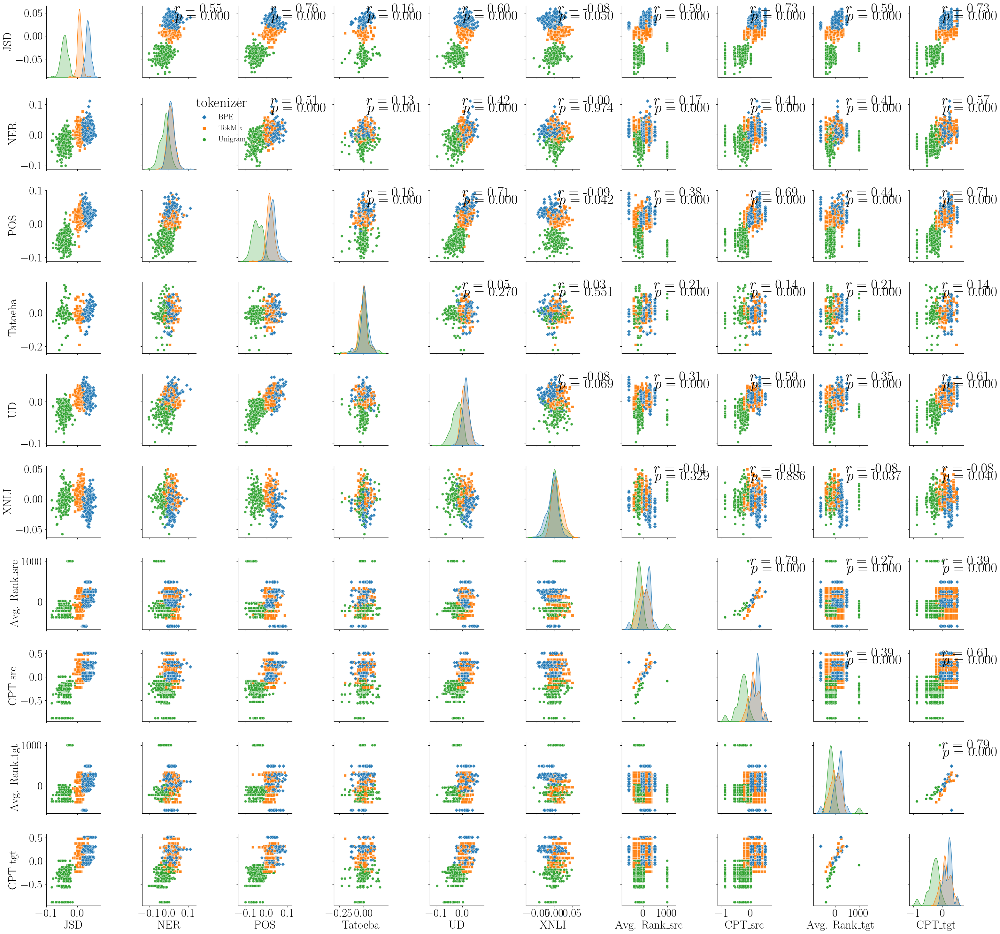

In [73]:
# spearman_r = in_lang_ca.corr(method='spearman').to_numpy()
# spearman_p = in_lang_ca.corr(method=lambda x, y: spearmanr(x, y)[1]).to_numpy()

#plt.figure(figsize=(3.5,3.5))
plot1 = sns.pairplot(X_lang_ca, hue="tokenizer",
                     markers=['D','s', 'o', 'p', 'X'],
                     plot_kws={'alpha': 0.9},
                    size=3)

plot1._legend.set_bbox_to_anchor((.25, 0.85))
# plt.legend(loc='center right', title='Type')
plot1.map
axes = plot1.axes
for i in range(len(X_lang_ca.columns) - 4):
    for j in range(i+1,len(X_lang_ca.columns)-3):
        ax = axes[i][j]
        r = spearman_r.to_numpy()[i,j]
        p = spearman_p.to_numpy()[i,j]
        ax.annotate(r"$r$ = {:.2f}".format(r), xy=(.6, .9), xycoords=ax.transAxes)
        ax.annotate(r"$p$ = {:.3f}".format(p), xy=(.6, .8), xycoords=ax.transAxes)
plt.tight_layout()
plt.savefig(os.path.join(FIGURE_DIR, "X_pair_analysis_20L.pdf"), dpi=300)


In [74]:
out_ca_x_lang = textify_results_ca(spearman_r.iloc[1:-4:,[0,6,7,8,9]], spearman_p.iloc[1:-4,[0,6,7,8,9]])

In [75]:
out_ca_x_lang

,JSD,Avg. Rank_src,CPT_src,Avg. Rank_tgt,CPT_tgt
NER,0.553**,0.172**,0.412**,0.409**,0.568**
POS,0.759**,0.383**,0.69**,0.436**,0.714**
Tatoeba,0.156**,0.214**,0.139**,0.214**,0.144**
UD,0.596**,0.314**,0.587**,0.351**,0.605**
XNLI,-0.078*,-0.039,-0.006,-0.083*,-0.082*


In [76]:
out_ca_x_lang.to_latex(os.path.join(TABLE_DIR,"corr_x_lang_20l.tex"), index=True,multirow=True,
                          longtable=False, escape=False, encoding="UTF-8",
                        caption="Correlations between task cross-lingual transfer results and tokenization measures."
                         "Stars denote statistical significance: (* coresponeds to $p<0.05$ and ** to $p<0.01$).",
                        label="tab:corr_x_lang_20l")